#### Importing necessary libraries


In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from pycaret.regression import *
sns.set()

#### Loading the Data


In [2]:
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")

In [3]:
train_data.head()

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides
0,2010-03-10 18:00:00,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,2.5,12.0,167.7
1,2010-03-10 19:00:00,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,2.1,9.9,98.9
2,2010-03-10 20:00:00,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,2.2,9.2,127.1
3,2010-03-10 21:00:00,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,2.2,9.7,177.2
4,2010-03-10 22:00:00,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,1.5,6.4,121.8


In [4]:
test_data.head()

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5
0,2011-01-01 00:00:00,8.0,41.3,0.4375,1108.8,745.7,797.1,880.0,1273.1
1,2011-01-01 01:00:00,5.1,51.7,0.4564,1249.5,864.9,687.9,972.8,1714.0
2,2011-01-01 02:00:00,5.8,51.5,0.4689,1102.6,878.0,693.7,941.9,1300.8
3,2011-01-01 03:00:00,5.0,52.3,0.4693,1139.7,916.2,725.6,1011.0,1283.0
4,2011-01-01 04:00:00,4.5,57.5,0.4650,1022.4,838.5,871.5,967.0,1142.3


<AxesSubplot:>

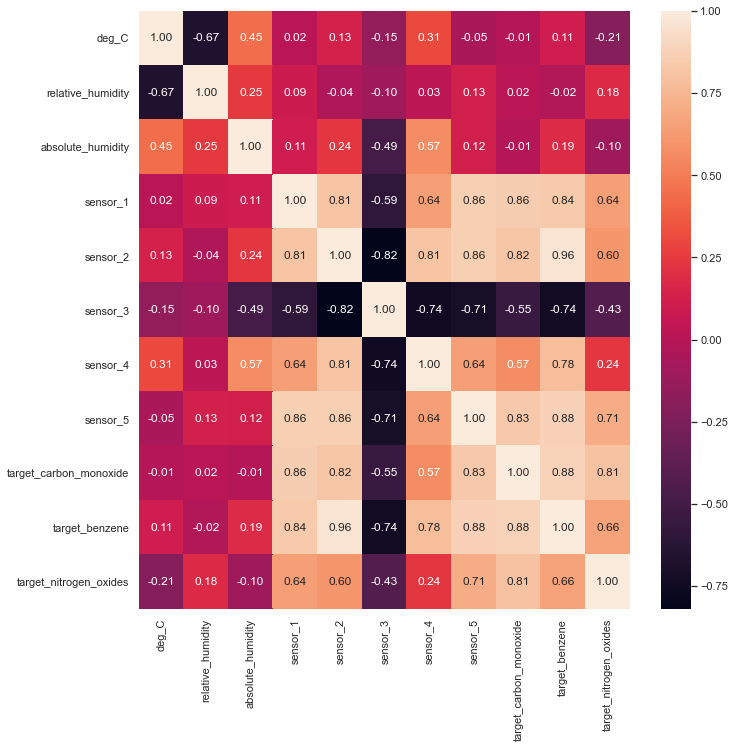

In [5]:
fig, ax = plt.subplots(figsize=(11,11))
sns.heatmap(train_data.corr(),annot = True,fmt = ".2f")

In [6]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7111 entries, 0 to 7110
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date_time               7111 non-null   object 
 1   deg_C                   7111 non-null   float64
 2   relative_humidity       7111 non-null   float64
 3   absolute_humidity       7111 non-null   float64
 4   sensor_1                7111 non-null   float64
 5   sensor_2                7111 non-null   float64
 6   sensor_3                7111 non-null   float64
 7   sensor_4                7111 non-null   float64
 8   sensor_5                7111 non-null   float64
 9   target_carbon_monoxide  7111 non-null   float64
 10  target_benzene          7111 non-null   float64
 11  target_nitrogen_oxides  7111 non-null   float64
dtypes: float64(11), object(1)
memory usage: 666.8+ KB


In [7]:
train_data['IsTrain'] = 1
test_data['IsTrain'] = 0
df = pd.concat([train_data,test_data], sort=False,axis=0)

df['date_time'] = pd.to_datetime(df['date_time'])

df['day_of_week'] = df['date_time'].dt.dayofweek
df['hour'] = df['date_time'].dt.hour
df['working_hours'] =  df.hour.isin(np.arange(8, 21, 1)).astype("int")
df.loc[(df['date_time'].dt.month >= 3) & (df['date_time'].dt.month <= 5), 'season'] = 1
df.loc[(df['date_time'].dt.month >= 6) & (df['date_time'].dt.month <= 8), 'season'] = 2
df.loc[(df['date_time'].dt.month >= 9) & (df['date_time'].dt.month <= 11), 'season'] = 3
df.loc[(df['date_time'].dt.month == 12) | (df['date_time'].dt.month <= 2), 'season'] = 4

train = df.query('IsTrain == 1').drop(['IsTrain'], axis=1)
test =  df.query('IsTrain == 0').drop(['IsTrain','target_carbon_monoxide','target_benzene','target_nitrogen_oxides'], axis=1)

In [8]:
train.head()

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides,day_of_week,hour,working_hours,season
0,2010-03-10 18:00:00,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,2.5,12.0,167.7,2,18,1,1.0
1,2010-03-10 19:00:00,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,2.1,9.9,98.9,2,19,1,1.0
2,2010-03-10 20:00:00,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,2.2,9.2,127.1,2,20,1,1.0
3,2010-03-10 21:00:00,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,2.2,9.7,177.2,2,21,0,1.0
4,2010-03-10 22:00:00,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,1.5,6.4,121.8,2,22,0,1.0


In [9]:
profile = ProfileReport(train, title="Pandas Profiling Report",explorative = 'true')
profile

In [10]:
def use_pycaret(target,train,test,categorical_features):
    model = setup(data = train, target = target, categorical_features = categorical_features,silent = True,data_split_shuffle = False, session_id=123)
    catboost = create_model("catboost")
    et = create_model("et")
    lightgbm = create_model("lightgbm")
    gbr = create_model("gbr")
    rf = create_model("rf")
    blend = blend_models(estimator_list= [catboost, et, lightgbm, gbr, rf], optimize='RMSLE')
    predh = predict_model(blend)
    final = finalize_model(blend)
    pred = predict_model(final, data=test)
    return pred

In [11]:
train_CO = train.loc[:,['deg_C', 'relative_humidity','absolute_humidity', 'sensor_1', 'sensor_2','sensor_3','sensor_4','sensor_5', 'season', 'working_hours', 'target_carbon_monoxide']]
train_CO.head()

,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,season,working_hours,target_carbon_monoxide
0,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,1.0,1,2.5
1,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,1.0,1,2.1
2,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,1.0,1,2.2
3,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,1.0,0,2.2
4,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,1.0,0,1.5


In [12]:
generated_CO = use_pycaret("target_carbon_monoxide",train_CO,test,['season','working_hours'])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2322,0.1144,0.3382,0.9399,0.0883,0.1102
1,0.2450,0.1452,0.3810,0.9129,0.1097,0.1302
2,0.2627,0.1338,0.3658,0.9301,0.1079,0.1389
3,0.3238,0.1756,0.4191,0.8797,0.1663,0.4014
4,0.2597,0.1397,0.3738,0.8888,0.1326,0.1753
5,0.2221,0.0901,0.3002,0.9283,0.1007,0.1689
6,0.2361,0.1083,0.3290,0.9059,0.1259,0.2444
7,0.1452,0.0390,0.1974,0.8861,0.0858,0.1449
8,0.2270,0.1071,0.3273,0.8942,0.1154,0.1500
9,0.2501,0.1418,0.3766,0.9360,0.0957,0.1150


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Voting Regressor,0.4636,0.7032,0.8386,0.7760,0.1968,0.2068


In [13]:
generated_CO

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,day_of_week,hour,working_hours,season,Label
0,2011-01-01 00:00:00,8.0,41.3,0.4375,1108.8,745.7,797.1,880.0,1273.1,5,0,0,4.0,1.499320
1,2011-01-01 01:00:00,5.1,51.7,0.4564,1249.5,864.9,687.9,972.8,1714.0,5,1,0,4.0,2.144273
2,2011-01-01 02:00:00,5.8,51.5,0.4689,1102.6,878.0,693.7,941.9,1300.8,5,2,0,4.0,1.753140
3,2011-01-01 03:00:00,5.0,52.3,0.4693,1139.7,916.2,725.6,1011.0,1283.0,5,3,0,4.0,1.848314
4,2011-01-01 04:00:00,4.5,57.5,0.4650,1022.4,838.5,871.5,967.0,1142.3,5,4,0,4.0,1.193415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2242,2011-04-04 10:00:00,23.2,28.7,0.7568,1340.3,1023.9,522.8,1374.0,1659.8,0,10,1,1.0,2.894344
2243,2011-04-04 11:00:00,24.5,22.5,0.7119,1232.8,955.1,616.1,1226.1,1269.0,0,11,1,1.0,2.345587
2244,2011-04-04 12:00:00,26.6,19.0,0.6406,1187.7,1052.4,572.8,1253.4,1081.1,0,12,1,1.0,2.503141
2245,2011-04-04 13:00:00,29.1,12.7,0.5139,1053.2,1009.0,702.0,1009.8,808.5,0,13,1,1.0,1.952200


In [ ]:
train_CO = train.loc[:,['deg_C', 'relative_humidity','absolute_humidity', 'sensor_1', 'sensor_3','sensor_4','sensor_5', 'season', 'working_hours', 'target_benzene']]
train_CO.head()